In [1]:
# Шаг 1: Загрузка данных или генерация
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_wine
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.metrics import accuracy_score, classification_report

# Загрузка набора данных


wine = load_wine()
X = pd.DataFrame(wine.data, columns=wine.feature_names)
y = pd.Series(wine.target)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

wine.feature_names

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

In [2]:
# Обучение Дерева решений
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_y_pred = dt_model.predict(X_test)

In [3]:
# оценка метрик
accuracy_dt = accuracy_score(y_test, dt_y_pred)
report_dt = classification_report(y_test, dt_y_pred, target_names=wine.target_names)

print(f"Accuracy: {accuracy_dt:.2f}")
print("Classification Report:\n", report_dt)

Accuracy: 0.94
Classification Report:
               precision    recall  f1-score   support

     class_0       0.93      0.93      0.93        14
     class_1       0.93      1.00      0.97        14
     class_2       1.00      0.88      0.93         8

    accuracy                           0.94        36
   macro avg       0.95      0.93      0.94        36
weighted avg       0.95      0.94      0.94        36



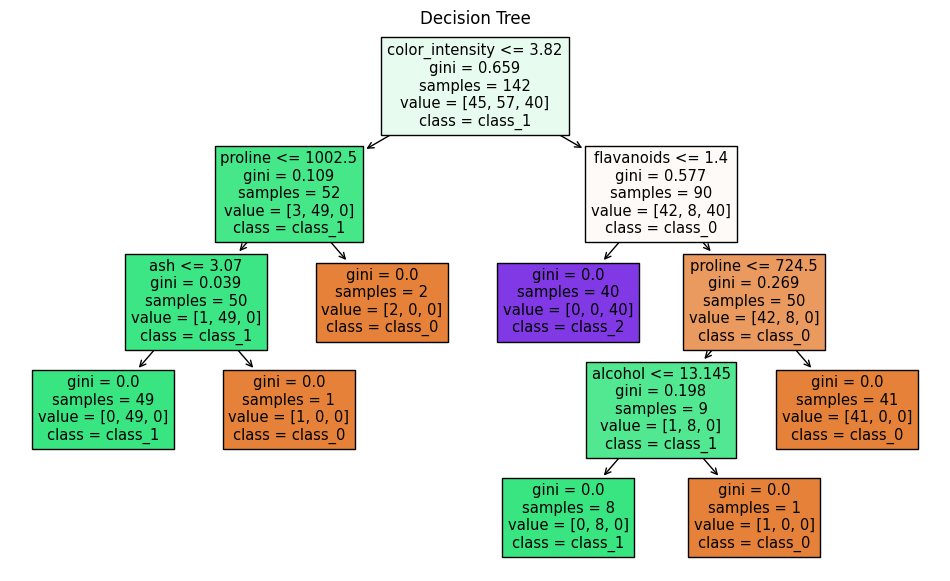

In [4]:
# Отрисовка дерева
class_names_list = wine.target_names.tolist()
plt.figure(figsize=(12, 7))
plot_tree(dt_model, 
          filled=True, 
          feature_names=wine.feature_names, 
          class_names=class_names_list)
plt.title("Decision Tree")
plt.show()

/home/vbond/Projects/Neurals/venv/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


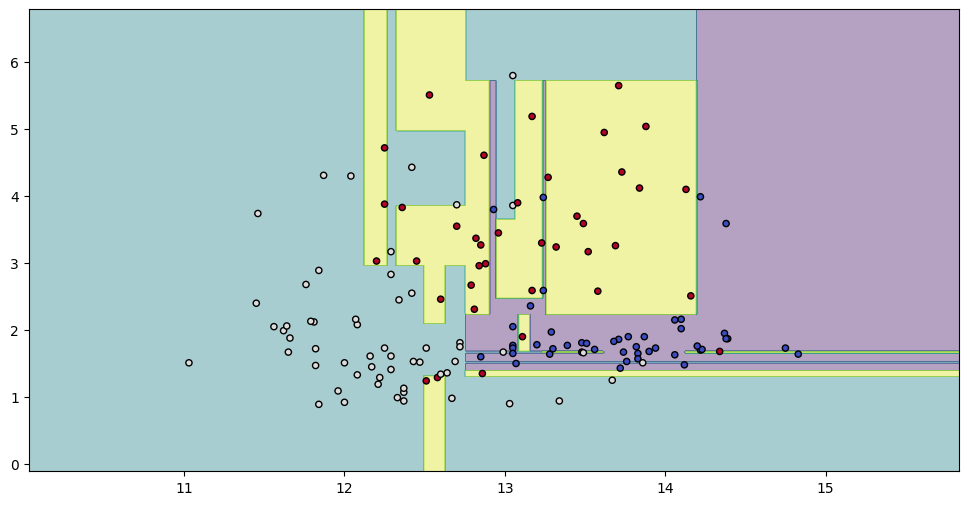

In [5]:
# Построение decisionboundary
def plot_decision_boundary(model, X, y):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.4)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolor='k')


# выбираю две фичи для dt
X_train_2d = X_train[["alcohol", "malic_acid"]]
dt_model.fit(X_train_2d, y_train)

plt.figure(figsize=(12, 6))
plot_decision_boundary(dt_model, X_train_2d.values, y_train)


In [6]:
# Обучение Случайного леса
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_y_pred = rf_model.predict(X_test)


In [7]:
# оценка метрик Случайного леса
accuracy_rf = accuracy_score(y_test, rf_y_pred)
report_rf = classification_report(y_test, rf_y_pred, target_names=wine.target_names)

print(f"Accuracy: {accuracy_rf:.2f}")
print("Classification Report:\n", report_rf)

Accuracy: 1.00
Classification Report:
               precision    recall  f1-score   support

     class_0       1.00      1.00      1.00        14
     class_1       1.00      1.00      1.00        14
     class_2       1.00      1.00      1.00         8

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36



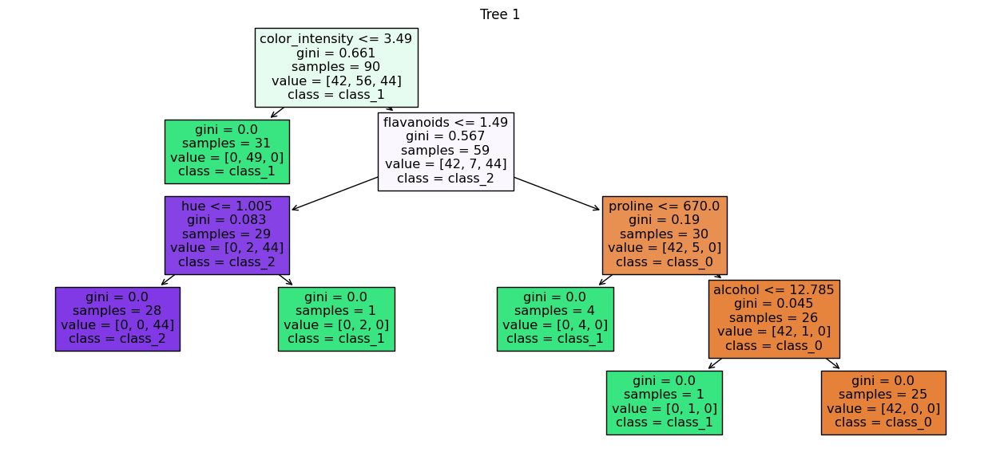

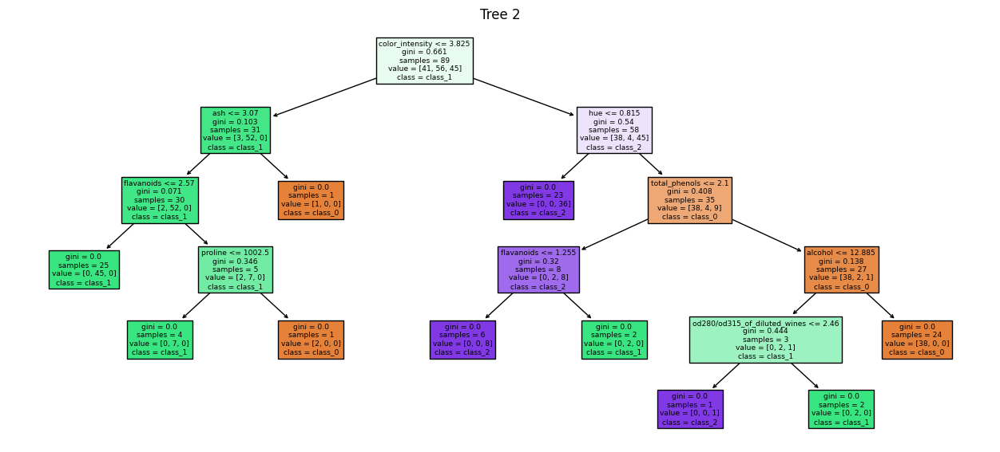

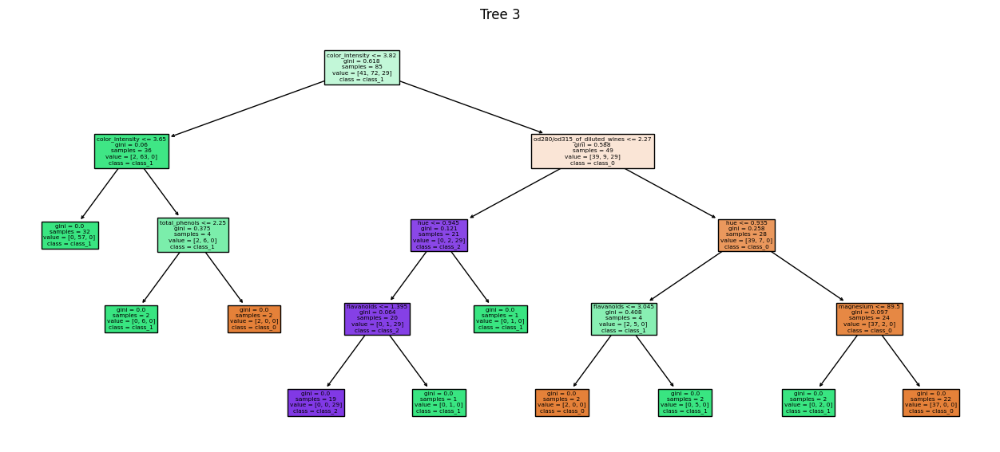

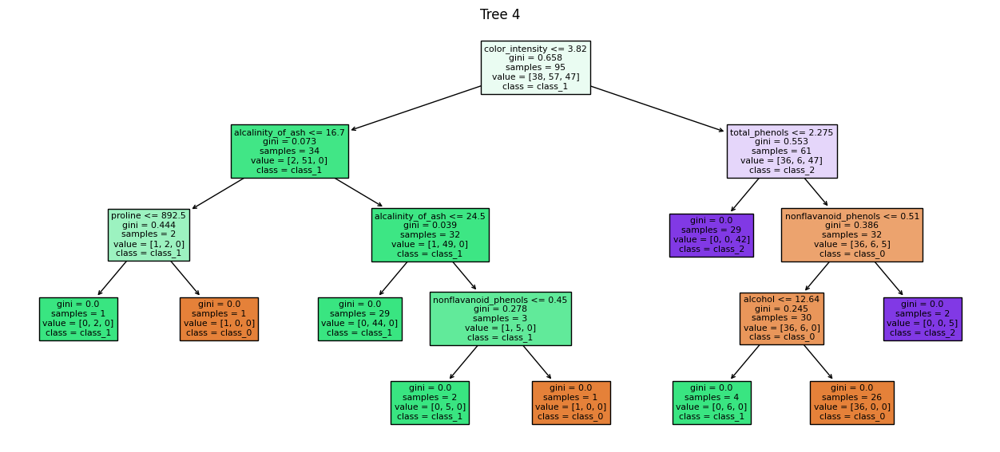

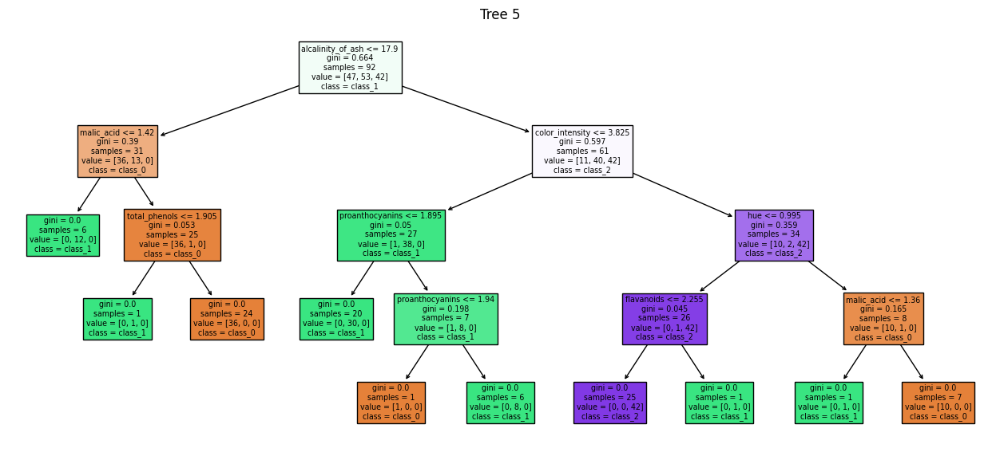

...

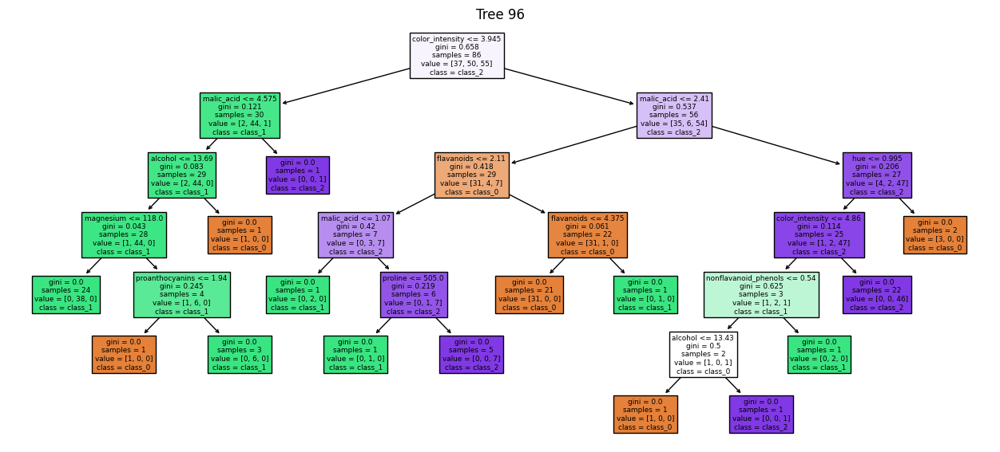

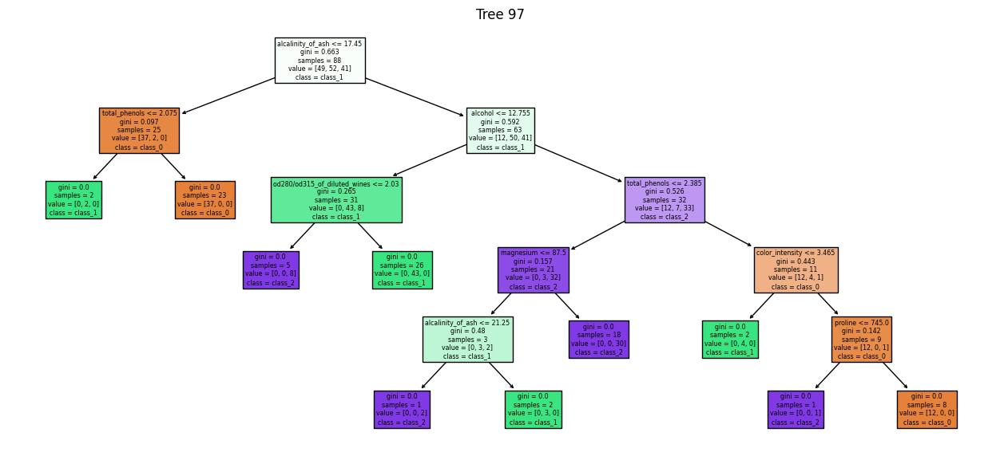

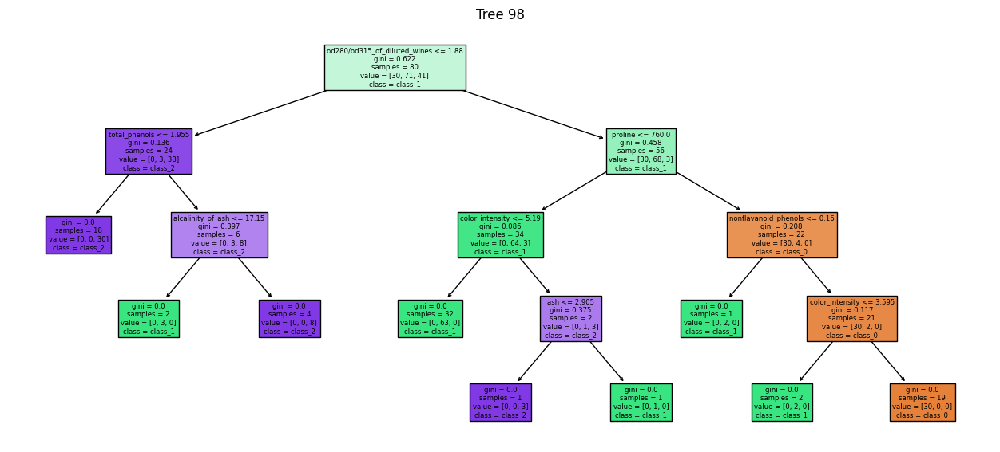

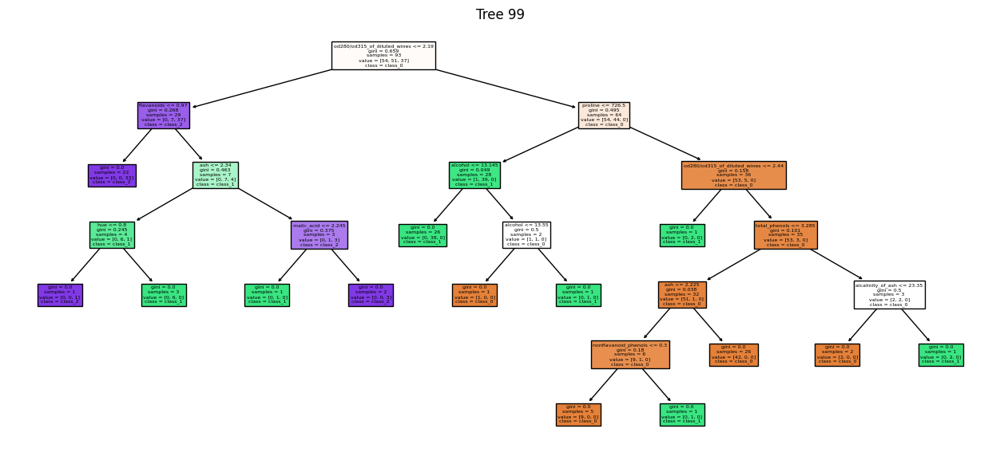

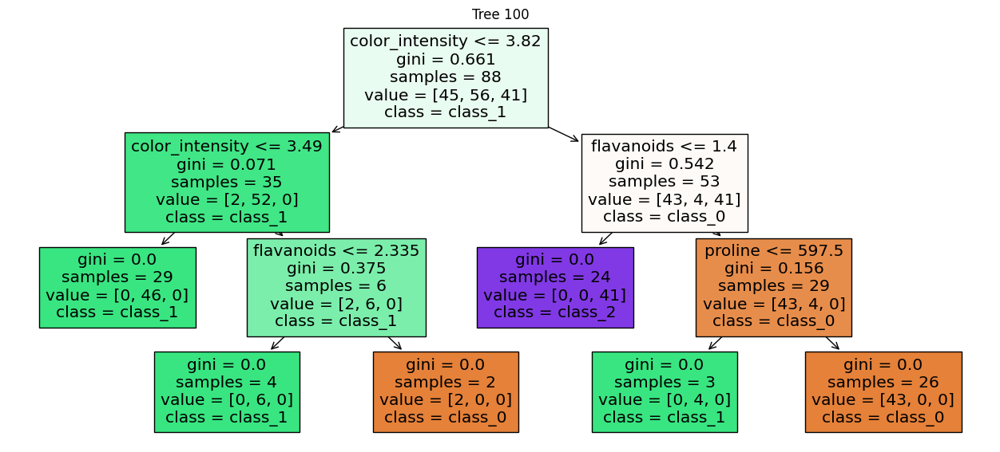

In [8]:
# Отрисовка деревьев случайного леса
n_estimators = len(rf_model.estimators_)

for i in range(n_estimators):
    plt.figure(figsize=(35, 15))
    plt.subplot(2, 2, 1)
    plot_tree(rf_model.estimators_[i],
              filled=True,
              feature_names=wine.feature_names,
              class_names=class_names_list)
    plt.title(f"Tree {i+1}")
    plt.show()



/home/vbond/Projects/Neurals/venv/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


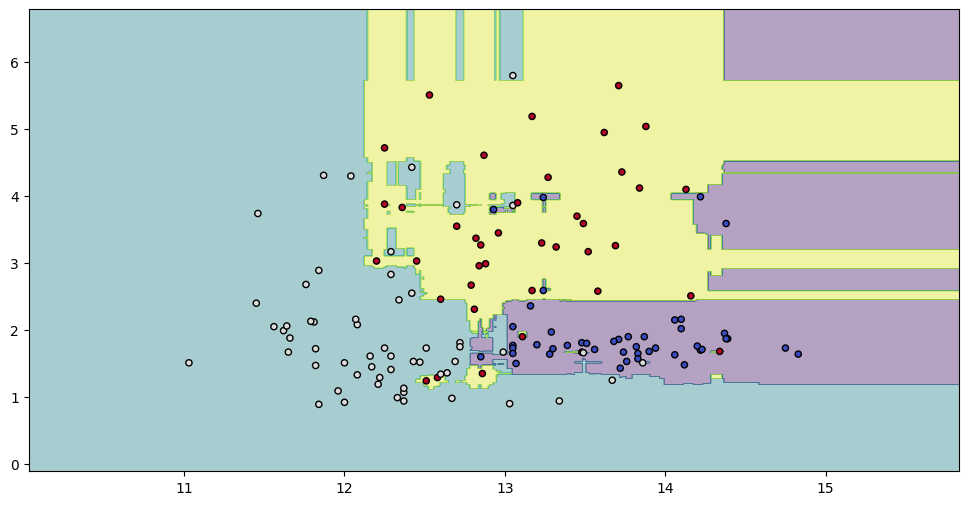

In [9]:
# выбираю две фичи для rf
X_train_2d = X_train[["alcohol", "malic_acid"]]
rf_model.fit(X_train_2d, y_train)

plt.figure(figsize=(12, 6))
plot_decision_boundary(rf_model, X_train_2d.values, y_train)